In [1]:
!pip install icecream einops ml_collections tensorboardX -q

In [2]:
!git clone https://github.com/hitachinsk/SAMed.git

fatal: destination path 'SAMed' already exists and is not an empty directory.


In [3]:
import sys
mods_to_remove = [m for m in sys.modules if m.startswith('segment_anything') 
                   or m.startswith('sam_lora') or m == 'trainer' or m == 'utils']
for m in mods_to_remove:
    del sys.modules[m]

sys.path = [p for p in sys.path if 'SAMed' not in p]
sys.path.insert(0, '/kaggle/working/SAMed/SAMed_h')

import os
ckpt_path = "/kaggle/working/SAMed/SAMed_h/checkpoints/sam_vit_h_4b8939.pth"
os.makedirs(os.path.dirname(ckpt_path), exist_ok=True)

if not os.path.exists(ckpt_path) or os.path.getsize(ckpt_path) < 2_000_000_000:
    print("Downloading checkpoint...")
    !wget -O {ckpt_path} https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
else:
    print("Checkpoint already exists:", os.path.getsize(ckpt_path) / 1e9, "GB")

--2026-08-16 19:18:25--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 99.84.118.117, 99.84.118.30, 99.84.118.60, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|99.84.118.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘/kaggle/working/SAMed/SAMed_h/checkpoints/sam_vit_h_4b8939.pth’

/kaggle/working/SAM 100%[===================>]   2.39G  38.6MB/s    in 63s     

2026-08-16 19:19:29 (38.6 MB/s) - ‘/kaggle/working/SAMed/SAMed_h/checkpoints/sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [5]:
from importlib import import_module
from segment_anything import sam_model_registry
import torch

import segment_anything
print(segment_anything.__file__) 

device = "cuda" if torch.cuda.is_available() else "cpu"
img_size = 112
num_classes = 8
vit_name = "vit_h"
rank = 4

sam, img_embedding_size = sam_model_registry[vit_name](
    image_size=img_size,
    num_classes=num_classes,
    checkpoint=ckpt_path,
    pixel_mean=[0, 0, 0],
    pixel_std=[1, 1, 1],
)

pkg = import_module("sam_lora_image_encoder")
model = pkg.LoRA_Sam(sam, rank).to(device)

multimask_output = num_classes > 1
low_res = img_embedding_size * 4

x = torch.randn(2, 3, img_size, img_size).to(device)
out = model(x, multimask_output, img_size)
print(out["masks"].shape)
print(out["low_res_logits"].shape)

/kaggle/working/SAMed/SAMed_h/segment_anything/__init__.py
torch.Size([2, 9, 112, 112])
torch.Size([2, 9, 28, 28])


In [17]:
import torch.nn as nn

sam, img_embedding_size = sam_model_registry[vit_name](
    image_size=img_size,
    num_classes=num_classes,
    checkpoint=ckpt_path,
    pixel_mean=[0, 0, 0],
    pixel_std=[1, 1, 1],
)
pkg = import_module("sam_lora_image_encoder")
lora_model = pkg.LoRA_Sam(sam, rank).to(device)  

class SAMedWrapper(nn.Module):
    def __init__(self, lora_sam_model, img_size, multimask_output=True):
        super().__init__()
        self.model = lora_sam_model
        self.img_size = img_size
        self.multimask_output = multimask_output

    def forward(self, x):
        out = self.model(x, self.multimask_output, self.img_size)
        return out["masks"]

model = SAMedWrapper(lora_model, img_size=img_size, multimask_output=(num_classes > 1)).to(device)

In [18]:
!pip install torch_optimizer
!pip install medpy
!pip install albumentations

In [19]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import glob
from PIL import Image
from sklearn.model_selection import train_test_split
import tensorflow as tf
import matplotlib.patches as mpatches

In [20]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import torchvision.transforms.functional as TF
import random

class SynapseDataset(Dataset):
    def __init__(self, npz_files, augment=False, image_size=(112,112)):
        self.files = []
        for f in npz_files:
            npz = np.load(f)
            image, label = npz['image'], npz['label']
            if np.max(image) > 0 and np.max(label) > 0:
                self.files.append(f)

        self.augment = augment
        self.image_size = image_size

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        npz = np.load(self.files[idx])
        image, label = npz['image'].astype(np.float32), npz['label'].astype(np.int64)
        
        image = (image - image.min()) / (image.max() - image.min() + 1e-8)
        image = np.expand_dims(image, axis=0) 

        image = torch.from_numpy(image)
        label = torch.from_numpy(label)

        image = TF.resize(image, self.image_size)
        label = TF.resize(label.unsqueeze(0).float(), self.image_size, interpolation=TF.InterpolationMode.NEAREST).squeeze(0).long()

        if self.augment:
            image, label = self.random_augment(image, label)

        return image, label

    def random_augment(self, image, label):
        if random.random() > 0.5:
            image = TF.hflip(image)
            label = TF.hflip(label)

        angle = random.uniform(-5, 5)
        image = TF.rotate(image, angle, interpolation=TF.InterpolationMode.BILINEAR)
        label = TF.rotate(label.unsqueeze(0), angle, interpolation=TF.InterpolationMode.NEAREST).squeeze(0)

        if random.random() > 0.5:
            factor = random.uniform(0.95, 1.05)
            image = TF.adjust_brightness(image, factor)

        return image, label

In [21]:
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

dataset_path = "/kaggle/input/datasets/dogcdt/synapse/Synapse/train_npz"
all_npz_files = sorted([os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.npz')])

# Split
train_files, val_files = train_test_split(all_npz_files, test_size=0.25, random_state=42)

train_dataset = SynapseDataset(train_files)
val_dataset = SynapseDataset(val_files)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=4)

In [22]:
images, masks = next(iter(train_loader))

print("Image batch shape:", images.shape) 
print("Mask batch shape:", masks.shape)   

Image batch shape: torch.Size([4, 1, 112, 112])
Mask batch shape: torch.Size([4, 112, 112])


In [23]:
LABEL_COLORS = {
    0: (0, 0, 0),           # Background
    1: (0, 102, 204),       # Aorta
    2: (0, 255, 0),         # Gallbladder
    3: (255, 0, 0),         # Left Kidney
    4: (0, 255, 255),       # Right Kidney
    5: (255, 0, 255),       # Liver
    6: (255, 255, 0),       # Pancreas
    7: (153, 0, 255),       # Spleen
    8: (255, 128, 0),       # Stomach
}

def colorize_mask(mask):
    mask = mask.cpu().numpy().astype(np.uint8)
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for label, color in LABEL_COLORS.items():
        color_mask[mask == label] = color
    return color_mask

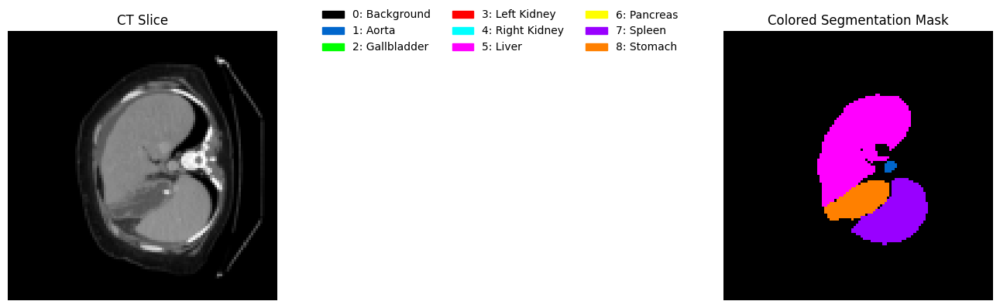

In [24]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

legend_handles = [
    mpatches.Patch(color=np.array(color)/255.0, label=f"{label_id}: {name}")
    for label_id, (name, color) in zip(
        LABEL_COLORS.keys(),
        [
            ("Background", (0,0,0)),
            ("Aorta", (0,102,204)),
            ("Gallbladder", (0,255,0)),
            ("Left Kidney", (255,0,0)),
            ("Right Kidney", (0,255,255)),
            ("Liver", (255,0,255)),
            ("Pancreas", (255,255,0)),
            ("Spleen", (153,0,255)),
            ("Stomach", (255,128,0)),
        ]
    )
]

images, masks = next(iter(train_loader))
img = images[0].squeeze().numpy()  # (H, W)
mask = masks[0]
colored_mask = colorize_mask(mask)

fig, axs = plt.subplots(1, 2, figsize=(24,4))
axs[0].imshow(img, cmap='gray')
axs[0].set_title("CT Slice")
axs[0].axis('off')

axs[1].imshow(colored_mask)
axs[1].set_title("Colored Segmentation Mask")
axs[1].axis('off')

fig.legend(handles=legend_handles, loc='upper center', ncol=3, fontsize=10, frameon=False)
plt.tight_layout()
plt.show()

In [25]:
import torch
import torch.nn.functional as F
import numpy as np
from medpy.metric.binary import hd

def dice_score(preds, targets, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    intersection = (preds_onehot * targets_onehot).sum(dim=(0,2,3))
    union = preds_onehot.sum(dim=(0,2,3)) + targets_onehot.sum(dim=(0,2,3))
    dice = (2. * intersection + eps) / (union + eps)
    return dice.mean().item()

def iou_score(preds, targets, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    intersection = (preds_onehot * targets_onehot).sum(dim=(0,2,3))
    union = (preds_onehot + targets_onehot - preds_onehot*targets_onehot).sum(dim=(0,2,3))
    iou = (intersection + eps) / (union + eps)
    return iou.mean().item()

def pixel_accuracy(preds, targets):
    return (preds.argmax(dim=1) == targets).float().mean().item()

def precision_score(preds, targets, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    tp = (preds_onehot * targets_onehot).sum(dim=(0,2,3))
    fp = (preds_onehot * (1 - targets_onehot)).sum(dim=(0,2,3))
    precision = (tp + eps) / (tp + fp + eps)
    return precision.mean().item()

def recall_score(preds, targets, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    tp = (preds_onehot * targets_onehot).sum(dim=(0,2,3))
    fn = ((1 - preds_onehot) * targets_onehot).sum(dim=(0,2,3))
    recall = (tp + eps) / (tp + fn + eps)
    return recall.mean().item()

def f1_score(preds, targets, eps=1e-7):
    prec = precision_score(preds, targets, eps)
    rec = recall_score(preds, targets, eps)
    f1 = 2 * prec * rec / (prec + rec + eps)
    return f1

def hausdorff_distance(preds, targets):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=preds.shape[1]).permute(0,3,1,2).float()
    targets_onehot = F.one_hot(targets, num_classes=preds.shape[1]).permute(0,3,1,2).float()
    distances = []
    for b in range(preds_onehot.shape[0]):
        for c in range(preds_onehot.shape[1]):
            p = preds_onehot[b,c].cpu().numpy().astype(bool)
            t = targets_onehot[b,c].cpu().numpy().astype(bool)
            if p.sum() == 0 or t.sum() == 0:
                distances.append(np.nan)
            else:
                try:
                    distances.append(hd(p, t))
                except:
                    distances.append(np.nan)
    return np.nanmean(distances)


In [26]:
import torch
import torch.nn as nn
import torch.optim as optim

class DiceLoss(nn.Module):
    def __init__(self, eps=1e-7):
        super(DiceLoss, self).__init__()
        self.eps = eps

    def forward(self, preds, targets):
        num_classes = preds.shape[1]
        preds = F.softmax(preds, dim=1)
        preds_one_hot = F.one_hot(preds.argmax(dim=1), num_classes=num_classes).permute(0,3,1,2).float()
        targets_one_hot = F.one_hot(targets, num_classes=num_classes).permute(0,3,1,2).float()

        intersection = (preds_one_hot * targets_one_hot).sum(dim=(0,2,3))
        union = preds_one_hot.sum(dim=(0,2,3)) + targets_one_hot.sum(dim=(0,2,3))
        dice = (2. * intersection + self.eps) / (union + self.eps)
        return 1 - dice.mean()

ce_loss = nn.CrossEntropyLoss()
dice_loss = DiceLoss()

def combined_loss(outputs, targets, ce_weight=0.5, dice_weight=0.5):
    return ce_weight * ce_loss(outputs, targets) + dice_weight * dice_loss(outputs, targets)

criterion = combined_loss
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5,weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", patience=4, factor=0.5)

In [31]:
from torch.amp import autocast, GradScaler
import torch
import torch.nn.functional as F
from tqdm import tqdm

scaler = GradScaler() 
accumulation_steps = 4
num_epochs =99

for epoch in range(1, num_epochs + 1):
    model.train()
    train_loss = 0.0
    train_dice = train_acc = train_iou = train_hd = 0.0
    train_mean_iou = train_precision = train_recall = train_f1 = 0.0

    optimizer.zero_grad()

    for step, (images, masks) in tqdm(enumerate(train_loader)):
        images, masks = images.to(device), masks.to(device)

        with autocast(device_type='cuda', dtype=torch.float16):
            outputs = model(images)  # [B, C, H, W]
            loss = criterion(outputs, masks) / accumulation_steps

        scaler.scale(loss).backward()

        if (step + 1) % accumulation_steps == 0 or (step + 1) == len(train_loader):
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        train_loss += loss.item() * accumulation_steps  
        train_dice += dice_score(outputs, masks)
        train_acc += pixel_accuracy(outputs, masks)
        train_iou += iou_score(outputs, masks)
        train_hd += hausdorff_distance(outputs, masks)
        train_mean_iou += iou_score(outputs, masks)  
        train_precision += precision_score(outputs, masks)
        train_recall += recall_score(outputs, masks)
        train_f1 += f1_score(outputs, masks)

    n_train = len(train_loader)
    avg_train_loss = train_loss / n_train
    avg_train_dice = train_dice / n_train
    avg_train_acc = train_acc / n_train
    avg_train_iou = train_iou / n_train
    avg_train_hd = train_hd / n_train
    avg_train_mean_iou = train_mean_iou / n_train
    avg_train_precision = train_precision / n_train
    avg_train_recall = train_recall / n_train
    avg_train_f1 = train_f1 / n_train

    model.eval()
    val_loss = 0.0
    val_dice = val_acc = val_iou = val_hd = 0.0
    val_mean_iou = val_precision = val_recall = val_f1 = 0.0

    with torch.no_grad():
        for images, masks in tqdm(val_loader):
            images, masks = images.to(device), masks.to(device)
            with autocast(device_type='cuda', dtype=torch.float16):
                outputs = model(images)
                loss = criterion(outputs, masks)

            val_loss += loss.item()
            val_dice += dice_score(outputs, masks)
            val_acc += pixel_accuracy(outputs, masks)
            val_iou += iou_score(outputs, masks)
            val_hd += hausdorff_distance(outputs, masks)
            val_mean_iou += iou_score(outputs, masks)
            val_precision += precision_score(outputs, masks)
            val_recall += recall_score(outputs, masks)
            val_f1 += f1_score(outputs, masks)

    n_val = len(val_loader)
    avg_val_loss = val_loss / n_val
    avg_val_dice = val_dice / n_val
    avg_val_acc = val_acc / n_val
    avg_val_iou = val_iou / n_val
    avg_val_hd = val_hd / n_val
    avg_val_mean_iou = val_mean_iou / n_val
    avg_val_precision = val_precision / n_val
    avg_val_recall = val_recall / n_val
    avg_val_f1 = val_f1 / n_val

    scheduler.step(avg_val_loss)

    print(f"Epoch {epoch:2d} | "
          f"Train Loss: {avg_train_loss:.6f} | Dice: {avg_train_dice:.4f} | Acc: {avg_train_acc:.4f} | "
          f"IoU: {avg_train_iou:.4f} | mIoU: {avg_train_mean_iou:.4f} | Precision: {avg_train_precision:.4f} | Recall: {avg_train_recall:.4f} | F1: {avg_train_f1:.4f} | HD: {avg_train_hd:.4f} || "
          f"Val Loss: {avg_val_loss:.6f} | Dice: {avg_val_dice:.4f} | Acc: {avg_val_acc:.4f} | "
          f"IoU: {avg_val_iou:.4f} | mIoU: {avg_val_mean_iou:.4f} | Precision: {avg_val_precision:.4f} | Recall: {avg_val_recall:.4f} | F1: {avg_val_f1:.4f} | HD: {avg_val_hd:.4f}")

240it [00:56,  4.26it/s]
100%|██████████| 81/81 [00:10<00:00,  8.02it/s]

Epoch  1 | Train Loss: 0.470403 | Dice: 0.2829 | Acc: 0.9400 | IoU: 0.2642 | mIoU: 0.2642 | Precision: 0.9580 | Recall: 0.2839 | F1: 0.4206 | HD: 28.2631 || Val Loss: 0.476833 | Dice: 0.2597 | Acc: 0.9405 | IoU: 0.2407 | mIoU: 0.2407 | Precision: 0.9648 | Recall: 0.2549 | F1: 0.3863 | HD: 29.1116



240it [00:56,  4.26it/s]
100%|██████████| 81/81 [00:10<00:00,  7.98it/s]

Epoch  2 | Train Loss: 0.447745 | Dice: 0.2935 | Acc: 0.9480 | IoU: 0.2742 | mIoU: 0.2742 | Precision: 0.9566 | Recall: 0.2995 | F1: 0.4414 | HD: 27.1354 || Val Loss: 0.448063 | Dice: 0.2796 | Acc: 0.9495 | IoU: 0.2603 | mIoU: 0.2603 | Precision: 0.9456 | Recall: 0.2831 | F1: 0.4210 | HD: 27.4605



240it [00:56,  4.25it/s]
100%|██████████| 81/81 [00:10<00:00,  7.83it/s]

Epoch  3 | Train Loss: 0.417115 | Dice: 0.3286 | Acc: 0.9539 | IoU: 0.3039 | mIoU: 0.3039 | Precision: 0.9175 | Recall: 0.3365 | F1: 0.4756 | HD: 24.7237 || Val Loss: 0.416298 | Dice: 0.3193 | Acc: 0.9559 | IoU: 0.2909 | mIoU: 0.2909 | Precision: 0.9002 | Recall: 0.3280 | F1: 0.4682 | HD: 22.8750



240it [00:56,  4.22it/s]
100%|██████████| 81/81 [00:10<00:00,  7.73it/s]

Epoch  4 | Train Loss: 0.398221 | Dice: 0.3474 | Acc: 0.9579 | IoU: 0.3192 | mIoU: 0.3192 | Precision: 0.8875 | Recall: 0.3607 | F1: 0.4987 | HD: 21.8721 || Val Loss: 0.397949 | Dice: 0.3415 | Acc: 0.9591 | IoU: 0.3080 | mIoU: 0.3080 | Precision: 0.8488 | Recall: 0.3527 | F1: 0.4872 | HD: 20.5474



240it [00:57,  4.18it/s]
100%|██████████| 81/81 [00:10<00:00,  7.71it/s]

Epoch  5 | Train Loss: 0.383876 | Dice: 0.3636 | Acc: 0.9609 | IoU: 0.3276 | mIoU: 0.3276 | Precision: 0.8504 | Recall: 0.3700 | F1: 0.5035 | HD: 20.1493 || Val Loss: 0.383376 | Dice: 0.3599 | Acc: 0.9617 | IoU: 0.3217 | mIoU: 0.3217 | Precision: 0.8570 | Recall: 0.3610 | F1: 0.4968 | HD: 19.8521



240it [00:57,  4.18it/s]
100%|██████████| 81/81 [00:10<00:00,  7.57it/s]

Epoch  6 | Train Loss: 0.364675 | Dice: 0.3919 | Acc: 0.9632 | IoU: 0.3498 | mIoU: 0.3498 | Precision: 0.8442 | Recall: 0.3983 | F1: 0.5278 | HD: 18.6657 || Val Loss: 0.359442 | Dice: 0.3979 | Acc: 0.9644 | IoU: 0.3502 | mIoU: 0.3502 | Precision: 0.8236 | Recall: 0.3975 | F1: 0.5266 | HD: 17.4026



240it [00:57,  4.17it/s]
100%|██████████| 81/81 [00:10<00:00,  7.44it/s]

Epoch  7 | Train Loss: 0.343630 | Dice: 0.4240 | Acc: 0.9655 | IoU: 0.3740 | mIoU: 0.3740 | Precision: 0.8391 | Recall: 0.4264 | F1: 0.5545 | HD: 16.6387 || Val Loss: 0.337758 | Dice: 0.4332 | Acc: 0.9664 | IoU: 0.3765 | mIoU: 0.3765 | Precision: 0.8104 | Recall: 0.4367 | F1: 0.5592 | HD: 15.2602



240it [00:58,  4.13it/s]
100%|██████████| 81/81 [00:10<00:00,  7.47it/s]

Epoch  8 | Train Loss: 0.326314 | Dice: 0.4503 | Acc: 0.9673 | IoU: 0.3942 | mIoU: 0.3942 | Precision: 0.8243 | Recall: 0.4476 | F1: 0.5705 | HD: 14.7858 || Val Loss: 0.324224 | Dice: 0.4512 | Acc: 0.9683 | IoU: 0.3918 | mIoU: 0.3918 | Precision: 0.8250 | Recall: 0.4454 | F1: 0.5709 | HD: 14.6180



240it [00:58,  4.11it/s]
100%|██████████| 81/81 [00:11<00:00,  7.36it/s]

Epoch  9 | Train Loss: 0.299256 | Dice: 0.4949 | Acc: 0.9698 | IoU: 0.4289 | mIoU: 0.4289 | Precision: 0.8212 | Recall: 0.4863 | F1: 0.6017 | HD: 13.3100 || Val Loss: 0.299277 | Dice: 0.4944 | Acc: 0.9701 | IoU: 0.4232 | mIoU: 0.4232 | Precision: 0.7878 | Recall: 0.5007 | F1: 0.6049 | HD: 13.4430



240it [00:58,  4.09it/s]
100%|██████████| 81/81 [00:11<00:00,  7.35it/s]

Epoch 10 | Train Loss: 0.273272 | Dice: 0.5391 | Acc: 0.9721 | IoU: 0.4647 | mIoU: 0.4647 | Precision: 0.8168 | Recall: 0.5280 | F1: 0.6334 | HD: 11.8665 || Val Loss: 0.275618 | Dice: 0.5338 | Acc: 0.9723 | IoU: 0.4567 | mIoU: 0.4567 | Precision: 0.7899 | Recall: 0.5256 | F1: 0.6247 | HD: 12.0326



240it [00:59,  4.07it/s]
100%|██████████| 81/81 [00:11<00:00,  7.24it/s]

Epoch 11 | Train Loss: 0.254278 | Dice: 0.5705 | Acc: 0.9739 | IoU: 0.4952 | mIoU: 0.4952 | Precision: 0.8112 | Recall: 0.5670 | F1: 0.6597 | HD: 10.9882 || Val Loss: 0.264528 | Dice: 0.5506 | Acc: 0.9737 | IoU: 0.4748 | mIoU: 0.4748 | Precision: 0.8247 | Recall: 0.5310 | F1: 0.6399 | HD: 11.6277



240it [00:59,  4.04it/s]
100%|██████████| 81/81 [00:11<00:00,  7.34it/s]

Epoch 12 | Train Loss: 0.241411 | Dice: 0.5910 | Acc: 0.9753 | IoU: 0.5117 | mIoU: 0.5117 | Precision: 0.8084 | Recall: 0.5805 | F1: 0.6695 | HD: 10.2631 || Val Loss: 0.256765 | Dice: 0.5625 | Acc: 0.9745 | IoU: 0.4827 | mIoU: 0.4827 | Precision: 0.8240 | Recall: 0.5353 | F1: 0.6433 | HD: 10.9294



240it [00:59,  4.04it/s]
100%|██████████| 81/81 [00:11<00:00,  7.25it/s]

Epoch 13 | Train Loss: 0.236903 | Dice: 0.5971 | Acc: 0.9761 | IoU: 0.5164 | mIoU: 0.5164 | Precision: 0.8117 | Recall: 0.5897 | F1: 0.6757 | HD: 9.9541 || Val Loss: 0.239125 | Dice: 0.5925 | Acc: 0.9762 | IoU: 0.5124 | mIoU: 0.5124 | Precision: 0.8117 | Recall: 0.5770 | F1: 0.6695 | HD: 9.8012



240it [00:59,  4.04it/s]
100%|██████████| 81/81 [00:11<00:00,  7.29it/s]

Epoch 14 | Train Loss: 0.218752 | Dice: 0.6292 | Acc: 0.9773 | IoU: 0.5483 | mIoU: 0.5483 | Precision: 0.8134 | Recall: 0.6220 | F1: 0.6989 | HD: 9.2778 || Val Loss: 0.232313 | Dice: 0.6030 | Acc: 0.9769 | IoU: 0.5233 | mIoU: 0.5233 | Precision: 0.8385 | Recall: 0.5795 | F1: 0.6811 | HD: 9.2807



240it [00:59,  4.05it/s]
100%|██████████| 81/81 [00:11<00:00,  7.29it/s]

Epoch 15 | Train Loss: 0.213777 | Dice: 0.6377 | Acc: 0.9775 | IoU: 0.5572 | mIoU: 0.5572 | Precision: 0.8181 | Recall: 0.6351 | F1: 0.7065 | HD: 8.9835 || Val Loss: 0.232685 | Dice: 0.6039 | Acc: 0.9768 | IoU: 0.5238 | mIoU: 0.5238 | Precision: 0.8511 | Recall: 0.5730 | F1: 0.6793 | HD: 9.0261



240it [00:59,  4.05it/s]
100%|██████████| 81/81 [00:11<00:00,  7.09it/s]

Epoch 16 | Train Loss: 0.202894 | Dice: 0.6564 | Acc: 0.9786 | IoU: 0.5757 | mIoU: 0.5757 | Precision: 0.8350 | Recall: 0.6393 | F1: 0.7181 | HD: 8.7033 || Val Loss: 0.209278 | Dice: 0.6435 | Acc: 0.9788 | IoU: 0.5613 | mIoU: 0.5613 | Precision: 0.8153 | Recall: 0.6396 | F1: 0.7128 | HD: 8.8109



240it [00:59,  4.01it/s]
100%|██████████| 81/81 [00:11<00:00,  7.19it/s]

Epoch 17 | Train Loss: 0.194404 | Dice: 0.6691 | Acc: 0.9799 | IoU: 0.5890 | mIoU: 0.5890 | Precision: 0.8296 | Recall: 0.6595 | F1: 0.7300 | HD: 8.2014 || Val Loss: 0.205717 | Dice: 0.6484 | Acc: 0.9793 | IoU: 0.5669 | mIoU: 0.5669 | Precision: 0.8263 | Recall: 0.6367 | F1: 0.7147 | HD: 8.5194



240it [01:01,  3.92it/s]
100%|██████████| 81/81 [00:11<00:00,  7.22it/s]

Epoch 18 | Train Loss: 0.191880 | Dice: 0.6715 | Acc: 0.9807 | IoU: 0.5914 | mIoU: 0.5914 | Precision: 0.8287 | Recall: 0.6633 | F1: 0.7328 | HD: 7.9154 || Val Loss: 0.206010 | Dice: 0.6464 | Acc: 0.9797 | IoU: 0.5652 | mIoU: 0.5652 | Precision: 0.8440 | Recall: 0.6265 | F1: 0.7146 | HD: 8.3813



240it [00:59,  4.03it/s]
100%|██████████| 81/81 [00:11<00:00,  7.17it/s]

Epoch 19 | Train Loss: 0.182948 | Dice: 0.6878 | Acc: 0.9811 | IoU: 0.6073 | mIoU: 0.6073 | Precision: 0.8361 | Recall: 0.6793 | F1: 0.7449 | HD: 7.6467 || Val Loss: 0.210652 | Dice: 0.6390 | Acc: 0.9789 | IoU: 0.5585 | mIoU: 0.5585 | Precision: 0.8733 | Recall: 0.6036 | F1: 0.7098 | HD: 7.8840



240it [00:59,  4.05it/s]
100%|██████████| 81/81 [00:11<00:00,  7.15it/s]

Epoch 20 | Train Loss: 0.178722 | Dice: 0.6953 | Acc: 0.9813 | IoU: 0.6148 | mIoU: 0.6148 | Precision: 0.8442 | Recall: 0.6847 | F1: 0.7508 | HD: 7.6073 || Val Loss: 0.191469 | Dice: 0.6723 | Acc: 0.9806 | IoU: 0.5890 | mIoU: 0.5890 | Precision: 0.8320 | Recall: 0.6574 | F1: 0.7307 | HD: 7.5827



240it [00:59,  4.04it/s]
100%|██████████| 81/81 [00:11<00:00,  7.13it/s]

Epoch 21 | Train Loss: 0.173653 | Dice: 0.7035 | Acc: 0.9819 | IoU: 0.6251 | mIoU: 0.6251 | Precision: 0.8430 | Recall: 0.6939 | F1: 0.7567 | HD: 7.4008 || Val Loss: 0.184175 | Dice: 0.6848 | Acc: 0.9814 | IoU: 0.6035 | mIoU: 0.6035 | Precision: 0.8527 | Recall: 0.6675 | F1: 0.7453 | HD: 7.7271



240it [00:59,  4.02it/s]
100%|██████████| 81/81 [00:11<00:00,  7.18it/s]

Epoch 22 | Train Loss: 0.162441 | Dice: 0.7239 | Acc: 0.9825 | IoU: 0.6459 | mIoU: 0.6459 | Precision: 0.8490 | Recall: 0.7109 | F1: 0.7704 | HD: 7.0496 || Val Loss: 0.179262 | Dice: 0.6933 | Acc: 0.9816 | IoU: 0.6111 | mIoU: 0.6111 | Precision: 0.8298 | Recall: 0.6820 | F1: 0.7456 | HD: 7.5068



240it [00:59,  4.04it/s]
100%|██████████| 81/81 [00:11<00:00,  7.21it/s]

Epoch 23 | Train Loss: 0.165265 | Dice: 0.7170 | Acc: 0.9829 | IoU: 0.6381 | mIoU: 0.6381 | Precision: 0.8520 | Recall: 0.7045 | F1: 0.7676 | HD: 6.9214 || Val Loss: 0.178367 | Dice: 0.6939 | Acc: 0.9821 | IoU: 0.6140 | mIoU: 0.6140 | Precision: 0.8470 | Recall: 0.6791 | F1: 0.7502 | HD: 7.2879



240it [00:59,  4.03it/s]
100%|██████████| 81/81 [00:11<00:00,  7.22it/s]

Epoch 24 | Train Loss: 0.159249 | Dice: 0.7289 | Acc: 0.9829 | IoU: 0.6492 | mIoU: 0.6492 | Precision: 0.8489 | Recall: 0.7180 | F1: 0.7738 | HD: 6.8698 || Val Loss: 0.174708 | Dice: 0.7011 | Acc: 0.9821 | IoU: 0.6200 | mIoU: 0.6200 | Precision: 0.8316 | Recall: 0.6928 | F1: 0.7521 | HD: 7.2779



240it [00:59,  4.04it/s]
100%|██████████| 81/81 [00:11<00:00,  7.17it/s]

Epoch 25 | Train Loss: 0.154655 | Dice: 0.7357 | Acc: 0.9838 | IoU: 0.6573 | mIoU: 0.6573 | Precision: 0.8528 | Recall: 0.7246 | F1: 0.7805 | HD: 6.5489 || Val Loss: 0.166352 | Dice: 0.7160 | Acc: 0.9828 | IoU: 0.6339 | mIoU: 0.6339 | Precision: 0.8135 | Recall: 0.7259 | F1: 0.7643 | HD: 7.3217



240it [00:59,  4.02it/s]
100%|██████████| 81/81 [00:11<00:00,  7.23it/s]

Epoch 26 | Train Loss: 0.152284 | Dice: 0.7395 | Acc: 0.9840 | IoU: 0.6617 | mIoU: 0.6617 | Precision: 0.8566 | Recall: 0.7346 | F1: 0.7869 | HD: 6.4741 || Val Loss: 0.168487 | Dice: 0.7109 | Acc: 0.9829 | IoU: 0.6296 | mIoU: 0.6296 | Precision: 0.8338 | Recall: 0.7042 | F1: 0.7606 | HD: 7.0734



240it [00:59,  4.01it/s]
100%|██████████| 81/81 [00:11<00:00,  7.18it/s]

Epoch 27 | Train Loss: 0.148773 | Dice: 0.7456 | Acc: 0.9843 | IoU: 0.6667 | mIoU: 0.6667 | Precision: 0.8658 | Recall: 0.7303 | F1: 0.7893 | HD: 6.2946 || Val Loss: 0.161250 | Dice: 0.7247 | Acc: 0.9831 | IoU: 0.6432 | mIoU: 0.6432 | Precision: 0.8274 | Recall: 0.7277 | F1: 0.7716 | HD: 7.1345



240it [00:59,  4.02it/s]
100%|██████████| 81/81 [00:11<00:00,  7.13it/s]

Epoch 28 | Train Loss: 0.144944 | Dice: 0.7528 | Acc: 0.9844 | IoU: 0.6743 | mIoU: 0.6743 | Precision: 0.8638 | Recall: 0.7461 | F1: 0.7970 | HD: 6.2663 || Val Loss: 0.163079 | Dice: 0.7196 | Acc: 0.9835 | IoU: 0.6384 | mIoU: 0.6384 | Precision: 0.8393 | Recall: 0.7091 | F1: 0.7660 | HD: 6.8036



240it [00:59,  4.03it/s]
100%|██████████| 81/81 [00:11<00:00,  7.15it/s]

Epoch 29 | Train Loss: 0.142523 | Dice: 0.7563 | Acc: 0.9848 | IoU: 0.6785 | mIoU: 0.6785 | Precision: 0.8673 | Recall: 0.7433 | F1: 0.7970 | HD: 6.0487 || Val Loss: 0.156651 | Dice: 0.7328 | Acc: 0.9834 | IoU: 0.6525 | mIoU: 0.6525 | Precision: 0.8343 | Recall: 0.7278 | F1: 0.7749 | HD: 6.7031



240it [00:59,  4.03it/s]
100%|██████████| 81/81 [00:11<00:00,  7.21it/s]

Epoch 30 | Train Loss: 0.138231 | Dice: 0.7643 | Acc: 0.9850 | IoU: 0.6876 | mIoU: 0.6876 | Precision: 0.8638 | Recall: 0.7542 | F1: 0.8024 | HD: 6.0189 || Val Loss: 0.154369 | Dice: 0.7356 | Acc: 0.9841 | IoU: 0.6559 | mIoU: 0.6559 | Precision: 0.8260 | Recall: 0.7425 | F1: 0.7796 | HD: 6.8867



240it [00:59,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.13it/s]

Epoch 31 | Train Loss: 0.138729 | Dice: 0.7623 | Acc: 0.9853 | IoU: 0.6848 | mIoU: 0.6848 | Precision: 0.8715 | Recall: 0.7505 | F1: 0.8034 | HD: 5.8187 || Val Loss: 0.155917 | Dice: 0.7318 | Acc: 0.9841 | IoU: 0.6512 | mIoU: 0.6512 | Precision: 0.8457 | Recall: 0.7216 | F1: 0.7763 | HD: 6.7251



240it [01:00,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.10it/s]

Epoch 32 | Train Loss: 0.137303 | Dice: 0.7646 | Acc: 0.9855 | IoU: 0.6877 | mIoU: 0.6877 | Precision: 0.8706 | Recall: 0.7543 | F1: 0.8051 | HD: 5.8645 || Val Loss: 0.153298 | Dice: 0.7367 | Acc: 0.9843 | IoU: 0.6564 | mIoU: 0.6564 | Precision: 0.8403 | Recall: 0.7289 | F1: 0.7780 | HD: 6.6352



240it [00:59,  4.01it/s]
100%|██████████| 81/81 [00:11<00:00,  7.15it/s]

Epoch 33 | Train Loss: 0.132718 | Dice: 0.7728 | Acc: 0.9858 | IoU: 0.6949 | mIoU: 0.6949 | Precision: 0.8701 | Recall: 0.7625 | F1: 0.8099 | HD: 5.6793 || Val Loss: 0.153798 | Dice: 0.7353 | Acc: 0.9843 | IoU: 0.6565 | mIoU: 0.6565 | Precision: 0.8617 | Recall: 0.7205 | F1: 0.7824 | HD: 6.3686



240it [01:00,  3.94it/s]
100%|██████████| 81/81 [00:12<00:00,  6.72it/s]

Epoch 34 | Train Loss: 0.129653 | Dice: 0.7779 | Acc: 0.9862 | IoU: 0.7008 | mIoU: 0.7008 | Precision: 0.8687 | Recall: 0.7662 | F1: 0.8118 | HD: 5.4590 || Val Loss: 0.150147 | Dice: 0.7418 | Acc: 0.9846 | IoU: 0.6639 | mIoU: 0.6639 | Precision: 0.8475 | Recall: 0.7391 | F1: 0.7870 | HD: 6.3838



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.02it/s]

Epoch 35 | Train Loss: 0.129748 | Dice: 0.7775 | Acc: 0.9862 | IoU: 0.6996 | mIoU: 0.6996 | Precision: 0.8711 | Recall: 0.7704 | F1: 0.8150 | HD: 5.4547 || Val Loss: 0.149493 | Dice: 0.7425 | Acc: 0.9848 | IoU: 0.6625 | mIoU: 0.6625 | Precision: 0.8386 | Recall: 0.7419 | F1: 0.7844 | HD: 6.4150



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.03it/s]

Epoch 36 | Train Loss: 0.126715 | Dice: 0.7826 | Acc: 0.9866 | IoU: 0.7060 | mIoU: 0.7060 | Precision: 0.8758 | Recall: 0.7751 | F1: 0.8201 | HD: 5.3111 || Val Loss: 0.148636 | Dice: 0.7443 | Acc: 0.9847 | IoU: 0.6667 | mIoU: 0.6667 | Precision: 0.8742 | Recall: 0.7273 | F1: 0.7915 | HD: 6.2391



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.19it/s]

Epoch 37 | Train Loss: 0.124225 | Dice: 0.7874 | Acc: 0.9866 | IoU: 0.7104 | mIoU: 0.7104 | Precision: 0.8787 | Recall: 0.7762 | F1: 0.8220 | HD: 5.3343 || Val Loss: 0.183166 | Dice: 0.6888 | Acc: 0.9801 | IoU: 0.6092 | mIoU: 0.6092 | Precision: 0.8989 | Recall: 0.6427 | F1: 0.7459 | HD: 6.4252



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.03it/s]

Epoch 38 | Train Loss: 0.129483 | Dice: 0.7805 | Acc: 0.9853 | IoU: 0.7040 | mIoU: 0.7040 | Precision: 0.8722 | Recall: 0.7733 | F1: 0.8150 | HD: 5.7949 || Val Loss: 0.144271 | Dice: 0.7518 | Acc: 0.9851 | IoU: 0.6721 | mIoU: 0.6721 | Precision: 0.8555 | Recall: 0.7393 | F1: 0.7908 | HD: 6.2497



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.10it/s]

Epoch 39 | Train Loss: 0.121920 | Dice: 0.7908 | Acc: 0.9870 | IoU: 0.7158 | mIoU: 0.7158 | Precision: 0.8812 | Recall: 0.7774 | F1: 0.8237 | HD: 5.1687 || Val Loss: 0.140212 | Dice: 0.7596 | Acc: 0.9854 | IoU: 0.6806 | mIoU: 0.6806 | Precision: 0.8354 | Recall: 0.7707 | F1: 0.7992 | HD: 6.3900



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.02it/s]

Epoch 40 | Train Loss: 0.113819 | Dice: 0.8070 | Acc: 0.9870 | IoU: 0.7316 | mIoU: 0.7316 | Precision: 0.8852 | Recall: 0.7929 | F1: 0.8345 | HD: 5.1290 || Val Loss: 0.141151 | Dice: 0.7575 | Acc: 0.9853 | IoU: 0.6766 | mIoU: 0.6766 | Precision: 0.8434 | Recall: 0.7586 | F1: 0.7957 | HD: 6.0862



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.05it/s]

Epoch 41 | Train Loss: 0.114928 | Dice: 0.8036 | Acc: 0.9874 | IoU: 0.7287 | mIoU: 0.7287 | Precision: 0.8847 | Recall: 0.7935 | F1: 0.8347 | HD: 4.9400 || Val Loss: 0.139801 | Dice: 0.7591 | Acc: 0.9857 | IoU: 0.6799 | mIoU: 0.6799 | Precision: 0.8738 | Recall: 0.7452 | F1: 0.8018 | HD: 5.8083



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.06it/s]

Epoch 42 | Train Loss: 0.113548 | Dice: 0.8059 | Acc: 0.9876 | IoU: 0.7322 | mIoU: 0.7322 | Precision: 0.8843 | Recall: 0.7955 | F1: 0.8355 | HD: 4.9436 || Val Loss: 0.140057 | Dice: 0.7586 | Acc: 0.9856 | IoU: 0.6775 | mIoU: 0.6775 | Precision: 0.8545 | Recall: 0.7562 | F1: 0.7998 | HD: 5.9504



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.10it/s]

Epoch 43 | Train Loss: 0.112990 | Dice: 0.8066 | Acc: 0.9877 | IoU: 0.7330 | mIoU: 0.7330 | Precision: 0.8849 | Recall: 0.8000 | F1: 0.8378 | HD: 4.8445 || Val Loss: 0.138811 | Dice: 0.7607 | Acc: 0.9857 | IoU: 0.6810 | mIoU: 0.6810 | Precision: 0.8544 | Recall: 0.7586 | F1: 0.8013 | HD: 5.8443



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.03it/s]

Epoch 44 | Train Loss: 0.112898 | Dice: 0.8064 | Acc: 0.9878 | IoU: 0.7330 | mIoU: 0.7330 | Precision: 0.8820 | Recall: 0.7990 | F1: 0.8364 | HD: 4.7557 || Val Loss: 0.130767 | Dice: 0.7769 | Acc: 0.9858 | IoU: 0.6975 | mIoU: 0.6975 | Precision: 0.8367 | Recall: 0.7937 | F1: 0.8126 | HD: 6.1331



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.01it/s]

Epoch 45 | Train Loss: 0.108253 | Dice: 0.8155 | Acc: 0.9879 | IoU: 0.7423 | mIoU: 0.7423 | Precision: 0.8851 | Recall: 0.8083 | F1: 0.8429 | HD: 4.6509 || Val Loss: 0.134408 | Dice: 0.7687 | Acc: 0.9860 | IoU: 0.6906 | mIoU: 0.6906 | Precision: 0.8729 | Recall: 0.7597 | F1: 0.8099 | HD: 5.7473



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.06it/s]

Epoch 46 | Train Loss: 0.105064 | Dice: 0.8212 | Acc: 0.9881 | IoU: 0.7494 | mIoU: 0.7494 | Precision: 0.8890 | Recall: 0.8127 | F1: 0.8473 | HD: 4.6429 || Val Loss: 0.133213 | Dice: 0.7709 | Acc: 0.9861 | IoU: 0.6921 | mIoU: 0.6921 | Precision: 0.8352 | Recall: 0.7882 | F1: 0.8087 | HD: 6.0016



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.03it/s]

Epoch 47 | Train Loss: 0.102636 | Dice: 0.8256 | Acc: 0.9882 | IoU: 0.7534 | mIoU: 0.7534 | Precision: 0.8928 | Recall: 0.8152 | F1: 0.8506 | HD: 4.5035 || Val Loss: 0.126684 | Dice: 0.7834 | Acc: 0.9863 | IoU: 0.7035 | mIoU: 0.7035 | Precision: 0.8502 | Recall: 0.7899 | F1: 0.8172 | HD: 5.8609



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.11it/s]

Epoch 48 | Train Loss: 0.105990 | Dice: 0.8190 | Acc: 0.9882 | IoU: 0.7463 | mIoU: 0.7463 | Precision: 0.8885 | Recall: 0.8105 | F1: 0.8456 | HD: 4.5315 || Val Loss: 0.128307 | Dice: 0.7803 | Acc: 0.9862 | IoU: 0.7015 | mIoU: 0.7015 | Precision: 0.8628 | Recall: 0.7805 | F1: 0.8178 | HD: 5.7522



240it [00:59,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.03it/s]

Epoch 49 | Train Loss: 0.102472 | Dice: 0.8256 | Acc: 0.9883 | IoU: 0.7530 | mIoU: 0.7530 | Precision: 0.8876 | Recall: 0.8178 | F1: 0.8495 | HD: 4.5336 || Val Loss: 0.124555 | Dice: 0.7871 | Acc: 0.9866 | IoU: 0.7081 | mIoU: 0.7081 | Precision: 0.8503 | Recall: 0.7966 | F1: 0.8205 | HD: 6.0186



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.04it/s]

Epoch 50 | Train Loss: 0.099155 | Dice: 0.8316 | Acc: 0.9886 | IoU: 0.7594 | mIoU: 0.7594 | Precision: 0.8925 | Recall: 0.8206 | F1: 0.8535 | HD: 4.3756 || Val Loss: 0.123239 | Dice: 0.7897 | Acc: 0.9865 | IoU: 0.7097 | mIoU: 0.7097 | Precision: 0.8365 | Recall: 0.8044 | F1: 0.8182 | HD: 5.9082



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.10it/s]

Epoch 51 | Train Loss: 0.099248 | Dice: 0.8311 | Acc: 0.9887 | IoU: 0.7586 | mIoU: 0.7586 | Precision: 0.8962 | Recall: 0.8221 | F1: 0.8556 | HD: 4.3751 || Val Loss: 0.123830 | Dice: 0.7883 | Acc: 0.9866 | IoU: 0.7092 | mIoU: 0.7092 | Precision: 0.8496 | Recall: 0.7996 | F1: 0.8218 | HD: 5.6589



240it [01:00,  3.96it/s]
100%|██████████| 81/81 [00:11<00:00,  6.92it/s]

Epoch 52 | Train Loss: 0.101940 | Dice: 0.8256 | Acc: 0.9887 | IoU: 0.7532 | mIoU: 0.7532 | Precision: 0.8903 | Recall: 0.8212 | F1: 0.8525 | HD: 4.3654 || Val Loss: 0.126070 | Dice: 0.7835 | Acc: 0.9866 | IoU: 0.7052 | mIoU: 0.7052 | Precision: 0.8648 | Recall: 0.7859 | F1: 0.8211 | HD: 5.6522



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.07it/s]

Epoch 53 | Train Loss: 0.096015 | Dice: 0.8370 | Acc: 0.9888 | IoU: 0.7669 | mIoU: 0.7669 | Precision: 0.8997 | Recall: 0.8257 | F1: 0.8597 | HD: 4.3154 || Val Loss: 0.121940 | Dice: 0.7915 | Acc: 0.9868 | IoU: 0.7132 | mIoU: 0.7132 | Precision: 0.8464 | Recall: 0.8059 | F1: 0.8238 | HD: 5.4924



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.04it/s]

Epoch 54 | Train Loss: 0.101340 | Dice: 0.8271 | Acc: 0.9886 | IoU: 0.7564 | mIoU: 0.7564 | Precision: 0.8952 | Recall: 0.8208 | F1: 0.8540 | HD: 4.4087 || Val Loss: 0.121799 | Dice: 0.7914 | Acc: 0.9869 | IoU: 0.7131 | mIoU: 0.7131 | Precision: 0.8517 | Recall: 0.7933 | F1: 0.8197 | HD: 5.6585



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.06it/s]

Epoch 55 | Train Loss: 0.098145 | Dice: 0.8327 | Acc: 0.9888 | IoU: 0.7618 | mIoU: 0.7618 | Precision: 0.8908 | Recall: 0.8312 | F1: 0.8576 | HD: 4.3574 || Val Loss: 0.121566 | Dice: 0.7917 | Acc: 0.9869 | IoU: 0.7130 | mIoU: 0.7130 | Precision: 0.8674 | Recall: 0.7879 | F1: 0.8236 | HD: 5.6789



240it [01:00,  3.94it/s]
100%|██████████| 81/81 [00:11<00:00,  6.95it/s]

Epoch 56 | Train Loss: 0.095968 | Dice: 0.8362 | Acc: 0.9892 | IoU: 0.7666 | mIoU: 0.7666 | Precision: 0.8976 | Recall: 0.8293 | F1: 0.8602 | HD: 4.1580 || Val Loss: 0.117897 | Dice: 0.7987 | Acc: 0.9870 | IoU: 0.7209 | mIoU: 0.7209 | Precision: 0.8468 | Recall: 0.8087 | F1: 0.8254 | HD: 5.4867



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.01it/s]

Epoch 57 | Train Loss: 0.096683 | Dice: 0.8347 | Acc: 0.9892 | IoU: 0.7635 | mIoU: 0.7635 | Precision: 0.8964 | Recall: 0.8265 | F1: 0.8582 | HD: 4.1712 || Val Loss: 0.120679 | Dice: 0.7936 | Acc: 0.9868 | IoU: 0.7159 | mIoU: 0.7159 | Precision: 0.8615 | Recall: 0.7949 | F1: 0.8249 | HD: 5.3957



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  6.98it/s]

Epoch 58 | Train Loss: 0.093768 | Dice: 0.8403 | Acc: 0.9892 | IoU: 0.7710 | mIoU: 0.7710 | Precision: 0.9016 | Recall: 0.8303 | F1: 0.8627 | HD: 4.0549 || Val Loss: 0.120486 | Dice: 0.7939 | Acc: 0.9869 | IoU: 0.7149 | mIoU: 0.7149 | Precision: 0.8575 | Recall: 0.7961 | F1: 0.8240 | HD: 5.6687



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.07it/s]

Epoch 59 | Train Loss: 0.093690 | Dice: 0.8407 | Acc: 0.9891 | IoU: 0.7708 | mIoU: 0.7708 | Precision: 0.8970 | Recall: 0.8345 | F1: 0.8627 | HD: 4.1374 || Val Loss: 0.117718 | Dice: 0.7987 | Acc: 0.9871 | IoU: 0.7204 | mIoU: 0.7204 | Precision: 0.8751 | Recall: 0.7911 | F1: 0.8291 | HD: 5.4183



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  6.99it/s]

Epoch 60 | Train Loss: 0.098604 | Dice: 0.8316 | Acc: 0.9888 | IoU: 0.7607 | mIoU: 0.7607 | Precision: 0.8935 | Recall: 0.8282 | F1: 0.8569 | HD: 4.3509 || Val Loss: 0.119718 | Dice: 0.7957 | Acc: 0.9867 | IoU: 0.7173 | mIoU: 0.7173 | Precision: 0.8485 | Recall: 0.8072 | F1: 0.8254 | HD: 5.8015



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.00it/s]

Epoch 61 | Train Loss: 0.092577 | Dice: 0.8424 | Acc: 0.9894 | IoU: 0.7721 | mIoU: 0.7721 | Precision: 0.9019 | Recall: 0.8328 | F1: 0.8644 | HD: 4.0944 || Val Loss: 0.114581 | Dice: 0.8044 | Acc: 0.9874 | IoU: 0.7283 | mIoU: 0.7283 | Precision: 0.8598 | Recall: 0.8159 | F1: 0.8353 | HD: 5.3890



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.06it/s]

Epoch 62 | Train Loss: 0.092065 | Dice: 0.8427 | Acc: 0.9896 | IoU: 0.7742 | mIoU: 0.7742 | Precision: 0.9016 | Recall: 0.8342 | F1: 0.8648 | HD: 3.9187 || Val Loss: 0.115805 | Dice: 0.8019 | Acc: 0.9874 | IoU: 0.7237 | mIoU: 0.7237 | Precision: 0.8686 | Recall: 0.7993 | F1: 0.8306 | HD: 5.2479



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  6.99it/s]

Epoch 63 | Train Loss: 0.090124 | Dice: 0.8472 | Acc: 0.9893 | IoU: 0.7773 | mIoU: 0.7773 | Precision: 0.9025 | Recall: 0.8378 | F1: 0.8671 | HD: 4.1055 || Val Loss: 0.116511 | Dice: 0.8010 | Acc: 0.9872 | IoU: 0.7242 | mIoU: 0.7242 | Precision: 0.8520 | Recall: 0.8190 | F1: 0.8333 | HD: 5.4607



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.09it/s]

Epoch 64 | Train Loss: 0.096901 | Dice: 0.8347 | Acc: 0.9889 | IoU: 0.7640 | mIoU: 0.7640 | Precision: 0.8957 | Recall: 0.8313 | F1: 0.8592 | HD: 4.3655 || Val Loss: 0.129417 | Dice: 0.7780 | Acc: 0.9860 | IoU: 0.7007 | mIoU: 0.7007 | Precision: 0.8916 | Recall: 0.7582 | F1: 0.8170 | HD: 5.2329



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.02it/s]

Epoch 65 | Train Loss: 0.091328 | Dice: 0.8440 | Acc: 0.9897 | IoU: 0.7749 | mIoU: 0.7749 | Precision: 0.9035 | Recall: 0.8356 | F1: 0.8667 | HD: 3.9219 || Val Loss: 0.109518 | Dice: 0.8141 | Acc: 0.9876 | IoU: 0.7371 | mIoU: 0.7371 | Precision: 0.8584 | Recall: 0.8233 | F1: 0.8390 | HD: 5.5668



240it [01:00,  3.96it/s]
100%|██████████| 81/81 [00:11<00:00,  7.00it/s]

Epoch 66 | Train Loss: 0.087498 | Dice: 0.8510 | Acc: 0.9899 | IoU: 0.7837 | mIoU: 0.7837 | Precision: 0.9038 | Recall: 0.8456 | F1: 0.8719 | HD: 3.8561 || Val Loss: 0.109725 | Dice: 0.8139 | Acc: 0.9875 | IoU: 0.7370 | mIoU: 0.7370 | Precision: 0.8438 | Recall: 0.8375 | F1: 0.8390 | HD: 5.3952



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  6.99it/s]

Epoch 67 | Train Loss: 0.085173 | Dice: 0.8556 | Acc: 0.9899 | IoU: 0.7880 | mIoU: 0.7880 | Precision: 0.9050 | Recall: 0.8491 | F1: 0.8746 | HD: 3.7740 || Val Loss: 0.111106 | Dice: 0.8103 | Acc: 0.9878 | IoU: 0.7348 | mIoU: 0.7348 | Precision: 0.8707 | Recall: 0.8138 | F1: 0.8394 | HD: 5.4811



240it [01:00,  3.96it/s]
100%|██████████| 81/81 [00:11<00:00,  7.00it/s]

Epoch 68 | Train Loss: 0.086196 | Dice: 0.8533 | Acc: 0.9900 | IoU: 0.7868 | mIoU: 0.7868 | Precision: 0.9041 | Recall: 0.8486 | F1: 0.8737 | HD: 3.7973 || Val Loss: 0.115296 | Dice: 0.8024 | Acc: 0.9874 | IoU: 0.7258 | mIoU: 0.7258 | Precision: 0.8804 | Recall: 0.7931 | F1: 0.8328 | HD: 5.0296



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.06it/s]

Epoch 69 | Train Loss: 0.087369 | Dice: 0.8509 | Acc: 0.9900 | IoU: 0.7842 | mIoU: 0.7842 | Precision: 0.9022 | Recall: 0.8459 | F1: 0.8713 | HD: 3.8196 || Val Loss: 0.112358 | Dice: 0.8074 | Acc: 0.9878 | IoU: 0.7312 | mIoU: 0.7312 | Precision: 0.8810 | Recall: 0.8033 | F1: 0.8384 | HD: 5.0181



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.13it/s]

Epoch 70 | Train Loss: 0.087230 | Dice: 0.8518 | Acc: 0.9897 | IoU: 0.7837 | mIoU: 0.7837 | Precision: 0.9051 | Recall: 0.8461 | F1: 0.8726 | HD: 3.9068 || Val Loss: 0.118555 | Dice: 0.7965 | Acc: 0.9872 | IoU: 0.7190 | mIoU: 0.7190 | Precision: 0.8914 | Recall: 0.7786 | F1: 0.8291 | HD: 5.2675



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.01it/s]

Epoch 71 | Train Loss: 0.081567 | Dice: 0.8617 | Acc: 0.9903 | IoU: 0.7941 | mIoU: 0.7941 | Precision: 0.9129 | Recall: 0.8484 | F1: 0.8781 | HD: 3.6960 || Val Loss: 0.106649 | Dice: 0.8183 | Acc: 0.9881 | IoU: 0.7429 | mIoU: 0.7429 | Precision: 0.8698 | Recall: 0.8227 | F1: 0.8442 | HD: 5.2264



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.08it/s]

Epoch 72 | Train Loss: 0.082910 | Dice: 0.8584 | Acc: 0.9906 | IoU: 0.7926 | mIoU: 0.7926 | Precision: 0.9070 | Recall: 0.8551 | F1: 0.8788 | HD: 3.6058 || Val Loss: 0.111332 | Dice: 0.8094 | Acc: 0.9878 | IoU: 0.7342 | mIoU: 0.7342 | Precision: 0.8974 | Recall: 0.7950 | F1: 0.8414 | HD: 5.1273



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.06it/s]

Epoch 73 | Train Loss: 0.079378 | Dice: 0.8653 | Acc: 0.9906 | IoU: 0.8009 | mIoU: 0.8009 | Precision: 0.9119 | Recall: 0.8567 | F1: 0.8821 | HD: 3.5105 || Val Loss: 0.107811 | Dice: 0.8158 | Acc: 0.9881 | IoU: 0.7410 | mIoU: 0.7410 | Precision: 0.8814 | Recall: 0.8128 | F1: 0.8442 | HD: 5.1040



240it [00:59,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.10it/s]

Epoch 74 | Train Loss: 0.080057 | Dice: 0.8639 | Acc: 0.9906 | IoU: 0.7978 | mIoU: 0.7978 | Precision: 0.9108 | Recall: 0.8556 | F1: 0.8811 | HD: 3.5015 || Val Loss: 0.106980 | Dice: 0.8173 | Acc: 0.9881 | IoU: 0.7422 | mIoU: 0.7422 | Precision: 0.8773 | Recall: 0.8144 | F1: 0.8432 | HD: 5.0784



240it [01:00,  3.96it/s]
100%|██████████| 81/81 [00:11<00:00,  7.01it/s]

Epoch 75 | Train Loss: 0.081400 | Dice: 0.8611 | Acc: 0.9907 | IoU: 0.7964 | mIoU: 0.7964 | Precision: 0.9084 | Recall: 0.8548 | F1: 0.8796 | HD: 3.4665 || Val Loss: 0.105250 | Dice: 0.8207 | Acc: 0.9882 | IoU: 0.7454 | mIoU: 0.7454 | Precision: 0.8744 | Recall: 0.8216 | F1: 0.8457 | HD: 5.1511



240it [01:00,  3.96it/s]
100%|██████████| 81/81 [00:11<00:00,  6.96it/s]

Epoch 76 | Train Loss: 0.079238 | Dice: 0.8652 | Acc: 0.9907 | IoU: 0.7995 | mIoU: 0.7995 | Precision: 0.9141 | Recall: 0.8564 | F1: 0.8831 | HD: 3.4533 || Val Loss: 0.106459 | Dice: 0.8183 | Acc: 0.9881 | IoU: 0.7432 | mIoU: 0.7432 | Precision: 0.8757 | Recall: 0.8193 | F1: 0.8451 | HD: 5.1640



240it [01:00,  3.94it/s]
100%|██████████| 81/81 [00:11<00:00,  6.96it/s]

Epoch 77 | Train Loss: 0.077471 | Dice: 0.8688 | Acc: 0.9907 | IoU: 0.8036 | mIoU: 0.8036 | Precision: 0.9126 | Recall: 0.8585 | F1: 0.8837 | HD: 3.4509 || Val Loss: 0.106596 | Dice: 0.8179 | Acc: 0.9882 | IoU: 0.7432 | mIoU: 0.7432 | Precision: 0.8822 | Recall: 0.8136 | F1: 0.8451 | HD: 5.1035



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.00it/s]

Epoch 78 | Train Loss: 0.076436 | Dice: 0.8707 | Acc: 0.9908 | IoU: 0.8051 | mIoU: 0.8051 | Precision: 0.9136 | Recall: 0.8606 | F1: 0.8853 | HD: 3.3834 || Val Loss: 0.105365 | Dice: 0.8206 | Acc: 0.9881 | IoU: 0.7461 | mIoU: 0.7461 | Precision: 0.8791 | Recall: 0.8179 | F1: 0.8460 | HD: 5.1585



240it [01:00,  3.96it/s]
100%|██████████| 81/81 [00:11<00:00,  6.98it/s]

Epoch 79 | Train Loss: 0.079427 | Dice: 0.8648 | Acc: 0.9908 | IoU: 0.7996 | mIoU: 0.7996 | Precision: 0.9100 | Recall: 0.8585 | F1: 0.8823 | HD: 3.4168 || Val Loss: 0.106264 | Dice: 0.8192 | Acc: 0.9879 | IoU: 0.7439 | mIoU: 0.7439 | Precision: 0.8886 | Recall: 0.8105 | F1: 0.8462 | HD: 5.0118



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.09it/s]

Epoch 80 | Train Loss: 0.079058 | Dice: 0.8656 | Acc: 0.9907 | IoU: 0.8006 | mIoU: 0.8006 | Precision: 0.9108 | Recall: 0.8574 | F1: 0.8821 | HD: 3.4714 || Val Loss: 0.111294 | Dice: 0.8100 | Acc: 0.9876 | IoU: 0.7342 | mIoU: 0.7342 | Precision: 0.9012 | Recall: 0.7917 | F1: 0.8413 | HD: 5.0487



240it [01:00,  3.96it/s]
100%|██████████| 81/81 [00:11<00:00,  7.01it/s]

Epoch 81 | Train Loss: 0.076685 | Dice: 0.8699 | Acc: 0.9909 | IoU: 0.8056 | mIoU: 0.8056 | Precision: 0.9118 | Recall: 0.8614 | F1: 0.8847 | HD: 3.3658 || Val Loss: 0.103933 | Dice: 0.8231 | Acc: 0.9882 | IoU: 0.7483 | mIoU: 0.7483 | Precision: 0.8777 | Recall: 0.8215 | F1: 0.8473 | HD: 5.0731



240it [01:00,  3.96it/s]
100%|██████████| 81/81 [00:11<00:00,  7.08it/s]

Epoch 82 | Train Loss: 0.078069 | Dice: 0.8668 | Acc: 0.9910 | IoU: 0.8027 | mIoU: 0.8027 | Precision: 0.9117 | Recall: 0.8573 | F1: 0.8826 | HD: 3.3593 || Val Loss: 0.105756 | Dice: 0.8194 | Acc: 0.9882 | IoU: 0.7448 | mIoU: 0.7448 | Precision: 0.8801 | Recall: 0.8170 | F1: 0.8459 | HD: 5.0908



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.06it/s]

Epoch 83 | Train Loss: 0.074048 | Dice: 0.8748 | Acc: 0.9911 | IoU: 0.8115 | mIoU: 0.8115 | Precision: 0.9150 | Recall: 0.8664 | F1: 0.8891 | HD: 3.3444 || Val Loss: 0.105221 | Dice: 0.8206 | Acc: 0.9882 | IoU: 0.7456 | mIoU: 0.7456 | Precision: 0.8863 | Recall: 0.8121 | F1: 0.8461 | HD: 4.9443



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.00it/s]

Epoch 84 | Train Loss: 0.075525 | Dice: 0.8718 | Acc: 0.9911 | IoU: 0.8077 | mIoU: 0.8077 | Precision: 0.9163 | Recall: 0.8645 | F1: 0.8886 | HD: 3.3676 || Val Loss: 0.105873 | Dice: 0.8191 | Acc: 0.9882 | IoU: 0.7442 | mIoU: 0.7442 | Precision: 0.8881 | Recall: 0.8122 | F1: 0.8470 | HD: 4.9914



240it [01:00,  3.97it/s]
100%|██████████| 81/81 [00:11<00:00,  7.06it/s]

Epoch 85 | Train Loss: 0.074381 | Dice: 0.8741 | Acc: 0.9911 | IoU: 0.8100 | mIoU: 0.8100 | Precision: 0.9161 | Recall: 0.8659 | F1: 0.8893 | HD: 3.3260 || Val Loss: 0.104748 | Dice: 0.8216 | Acc: 0.9882 | IoU: 0.7470 | mIoU: 0.7470 | Precision: 0.8777 | Recall: 0.8182 | F1: 0.8454 | HD: 5.0089



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.01it/s]

Epoch 86 | Train Loss: 0.076581 | Dice: 0.8696 | Acc: 0.9911 | IoU: 0.8056 | mIoU: 0.8056 | Precision: 0.9146 | Recall: 0.8625 | F1: 0.8866 | HD: 3.3434 || Val Loss: 0.106144 | Dice: 0.8188 | Acc: 0.9882 | IoU: 0.7438 | mIoU: 0.7438 | Precision: 0.8861 | Recall: 0.8102 | F1: 0.8449 | HD: 5.0595



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.01it/s]

Epoch 87 | Train Loss: 0.073654 | Dice: 0.8753 | Acc: 0.9912 | IoU: 0.8126 | mIoU: 0.8126 | Precision: 0.9166 | Recall: 0.8650 | F1: 0.8892 | HD: 3.2719 || Val Loss: 0.104032 | Dice: 0.8227 | Acc: 0.9883 | IoU: 0.7481 | mIoU: 0.7481 | Precision: 0.8792 | Recall: 0.8222 | F1: 0.8482 | HD: 5.1368



240it [01:00,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.07it/s]

Epoch 88 | Train Loss: 0.074344 | Dice: 0.8739 | Acc: 0.9912 | IoU: 0.8105 | mIoU: 0.8105 | Precision: 0.9162 | Recall: 0.8650 | F1: 0.8888 | HD: 3.2859 || Val Loss: 0.104613 | Dice: 0.8216 | Acc: 0.9883 | IoU: 0.7472 | mIoU: 0.7472 | Precision: 0.8883 | Recall: 0.8141 | F1: 0.8481 | HD: 5.1104



240it [00:59,  4.02it/s]
100%|██████████| 81/81 [00:11<00:00,  7.10it/s]

Epoch 89 | Train Loss: 0.074831 | Dice: 0.8729 | Acc: 0.9912 | IoU: 0.8086 | mIoU: 0.8086 | Precision: 0.9149 | Recall: 0.8632 | F1: 0.8875 | HD: 3.2755 || Val Loss: 0.103918 | Dice: 0.8230 | Acc: 0.9883 | IoU: 0.7484 | mIoU: 0.7484 | Precision: 0.8855 | Recall: 0.8170 | F1: 0.8484 | HD: 5.0439



240it [00:59,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.05it/s]

Epoch 90 | Train Loss: 0.075071 | Dice: 0.8724 | Acc: 0.9912 | IoU: 0.8090 | mIoU: 0.8090 | Precision: 0.9163 | Recall: 0.8618 | F1: 0.8872 | HD: 3.2546 || Val Loss: 0.105176 | Dice: 0.8205 | Acc: 0.9882 | IoU: 0.7459 | mIoU: 0.7459 | Precision: 0.8802 | Recall: 0.8166 | F1: 0.8456 | HD: 5.0004



240it [01:00,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.08it/s]

Epoch 91 | Train Loss: 0.075470 | Dice: 0.8716 | Acc: 0.9912 | IoU: 0.8079 | mIoU: 0.8079 | Precision: 0.9170 | Recall: 0.8622 | F1: 0.8877 | HD: 3.2820 || Val Loss: 0.104131 | Dice: 0.8224 | Acc: 0.9883 | IoU: 0.7478 | mIoU: 0.7478 | Precision: 0.8842 | Recall: 0.8191 | F1: 0.8490 | HD: 5.0460



240it [01:00,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.03it/s]

Epoch 92 | Train Loss: 0.074429 | Dice: 0.8737 | Acc: 0.9912 | IoU: 0.8103 | mIoU: 0.8103 | Precision: 0.9177 | Recall: 0.8642 | F1: 0.8892 | HD: 3.2960 || Val Loss: 0.104293 | Dice: 0.8222 | Acc: 0.9883 | IoU: 0.7476 | mIoU: 0.7476 | Precision: 0.8832 | Recall: 0.8175 | F1: 0.8475 | HD: 5.0329



240it [01:00,  3.98it/s]
100%|██████████| 81/81 [00:11<00:00,  7.00it/s]

Epoch 93 | Train Loss: 0.075013 | Dice: 0.8724 | Acc: 0.9912 | IoU: 0.8090 | mIoU: 0.8090 | Precision: 0.9164 | Recall: 0.8640 | F1: 0.8883 | HD: 3.2714 || Val Loss: 0.103315 | Dice: 0.8241 | Acc: 0.9883 | IoU: 0.7493 | mIoU: 0.7493 | Precision: 0.8794 | Recall: 0.8235 | F1: 0.8490 | HD: 5.0118



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.15it/s]

Epoch 94 | Train Loss: 0.076086 | Dice: 0.8703 | Acc: 0.9912 | IoU: 0.8077 | mIoU: 0.8077 | Precision: 0.9142 | Recall: 0.8638 | F1: 0.8870 | HD: 3.3096 || Val Loss: 0.104179 | Dice: 0.8224 | Acc: 0.9883 | IoU: 0.7476 | mIoU: 0.7476 | Precision: 0.8830 | Recall: 0.8181 | F1: 0.8479 | HD: 4.9798



240it [01:00,  3.99it/s]
100%|██████████| 81/81 [00:11<00:00,  7.12it/s]

Epoch 95 | Train Loss: 0.072106 | Dice: 0.8783 | Acc: 0.9912 | IoU: 0.8152 | mIoU: 0.8152 | Precision: 0.9155 | Recall: 0.8714 | F1: 0.8918 | HD: 3.2557 || Val Loss: 0.103580 | Dice: 0.8235 | Acc: 0.9884 | IoU: 0.7487 | mIoU: 0.7487 | Precision: 0.8777 | Recall: 0.8249 | F1: 0.8489 | HD: 5.0748



240it [00:59,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.11it/s]

Epoch 96 | Train Loss: 0.073280 | Dice: 0.8758 | Acc: 0.9913 | IoU: 0.8131 | mIoU: 0.8131 | Precision: 0.9154 | Recall: 0.8675 | F1: 0.8899 | HD: 3.2619 || Val Loss: 0.103844 | Dice: 0.8230 | Acc: 0.9883 | IoU: 0.7483 | mIoU: 0.7483 | Precision: 0.8859 | Recall: 0.8179 | F1: 0.8491 | HD: 5.0760



240it [00:59,  4.01it/s]
100%|██████████| 81/81 [00:11<00:00,  7.13it/s]

Epoch 97 | Train Loss: 0.077235 | Dice: 0.8679 | Acc: 0.9913 | IoU: 0.8051 | mIoU: 0.8051 | Precision: 0.9140 | Recall: 0.8621 | F1: 0.8860 | HD: 3.2842 || Val Loss: 0.104171 | Dice: 0.8223 | Acc: 0.9884 | IoU: 0.7479 | mIoU: 0.7479 | Precision: 0.8821 | Recall: 0.8217 | F1: 0.8493 | HD: 5.0103



240it [00:59,  4.02it/s]
100%|██████████| 81/81 [00:11<00:00,  7.09it/s]

Epoch 98 | Train Loss: 0.074162 | Dice: 0.8740 | Acc: 0.9913 | IoU: 0.8111 | mIoU: 0.8111 | Precision: 0.9174 | Recall: 0.8641 | F1: 0.8889 | HD: 3.2477 || Val Loss: 0.104412 | Dice: 0.8218 | Acc: 0.9884 | IoU: 0.7475 | mIoU: 0.7475 | Precision: 0.8800 | Recall: 0.8218 | F1: 0.8483 | HD: 5.0479



240it [00:59,  4.00it/s]
100%|██████████| 81/81 [00:11<00:00,  7.11it/s]

Epoch 99 | Train Loss: 0.071676 | Dice: 0.8789 | Acc: 0.9913 | IoU: 0.8154 | mIoU: 0.8154 | Precision: 0.9178 | Recall: 0.8703 | F1: 0.8923 | HD: 3.2012 || Val Loss: 0.103483 | Dice: 0.8236 | Acc: 0.9884 | IoU: 0.7493 | mIoU: 0.7493 | Precision: 0.8781 | Recall: 0.8252 | F1: 0.8492 | HD: 5.0123


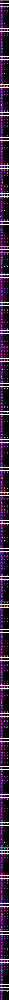

In [32]:
import matplotlib.pyplot as plt
import torch
import numpy as np

LABEL_COLORS = {
    0: (0, 0, 0),         # Background
    1: (0, 102, 204),     # Aorta
    2: (0, 255, 0),       # Gallbladder
    3: (255, 0, 0),       # Left Kidney
    4: (0, 255, 255),     # Right Kidney
    5: (255, 0, 255),     # Liver
    6: (255, 255, 0),     # Pancreas
    7: (153, 0, 255),     # Spleen
    8: (255, 128, 0),     # Stomach
}

def colorize_mask(mask):
    if torch.is_tensor(mask):
        mask = mask.cpu().numpy().astype(np.uint8)
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for label_id, color in LABEL_COLORS.items():
        color_mask[mask == label_id] = color
    return color_mask

def visualize_predictions(model, loader, device, num_samples=300):
    model.eval()
    images_list, gt_list, pred_list = [], [], []

    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)  
            preds = outputs.argmax(dim=1)  

            images_list.append(images.cpu())
            gt_list.append(masks.cpu())
            pred_list.append(preds.cpu())

            if sum([x.shape[0] for x in images_list]) >= num_samples:
                break

    images_all = torch.cat(images_list, dim=0)[:num_samples]
    gt_all = torch.cat(gt_list, dim=0)[:num_samples]
    pred_all = torch.cat(pred_list, dim=0)[:num_samples]

    # Plot
    plt.figure(figsize=(6, num_samples*2))
    for i in range(num_samples):
        # Original image
        plt.subplot(num_samples, 3, i*3 + 1)
        img = images_all[i].permute(1,2,0)  
        plt.imshow(img)
        plt.axis('off')
        if i == 0:
            plt.title("Image")

        # Ground Truth
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(colorize_mask(gt_all[i]))
        plt.axis('off')
        if i == 0:
            plt.title("Ground Truth")

        # Prediction
        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(colorize_mask(pred_all[i]))
        plt.axis('off')
        if i == 0:
            plt.title("Prediction")

    plt.tight_layout()
    plt.show()

visualize_predictions(model, val_loader, device, num_samples=321)

In [33]:
import torch
import torch.nn.functional as F

def dice_per_class(preds, targets, num_classes, eps=1e-7):
    preds_onehot = F.one_hot(preds.argmax(dim=1), num_classes=num_classes) 
    preds_onehot = preds_onehot.permute(0,3,1,2).float() 

    targets_onehot = F.one_hot(targets, num_classes=num_classes)  
    targets_onehot = targets_onehot.permute(0,3,1,2).float()  

    dice_scores = []
    for c in range(num_classes):
        pred_c = preds_onehot[:,c]
        target_c = targets_onehot[:,c]
        intersection = (pred_c * target_c).sum(dim=(0,1,2))
        union = pred_c.sum(dim=(0,1,2)) + target_c.sum(dim=(0,1,2))
        dice = (2*intersection + eps)/(union + eps)
        dice_scores.append(dice.item())
    
    return dice_scores  

In [34]:
model.eval()
num_classes = 9  # 0:background + 8 organs

with torch.no_grad():
    for images, masks in val_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)  # [B, C, H, W]
        per_class_dice = dice_per_class(outputs, masks, num_classes=num_classes)
        break  # only first batch for demo

organ_names = ["Background", "Aorta", "Gallbladder", "Left Kidney", "Right Kidney", 
               "Liver", "Pancreas", "Spleen", "Stomach"]

for name, dice in zip(organ_names, per_class_dice):
    print(f"{name}: {dice*100:.2f}%")


Background: 99.08%
Aorta: 89.42%
Gallbladder: 4.44%
Left Kidney: 84.00%
Right Kidney: 81.36%
Liver: 94.56%
Pancreas: 50.00%
Spleen: 91.96%
Stomach: 77.40%


In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

LABEL_COLORS = {
    0: (0, 0, 0),         # Background
    1: (0, 102, 204),     # Aorta
    2: (0, 255, 0),       # Gallbladder
    3: (255, 0, 0),       # Left Kidney
    4: (0, 255, 255),     # Right Kidney
    5: (255, 0, 255),     # Liver
    6: (255, 255, 0),     # Pancreas
    7: (153, 0, 255),     # Spleen
    8: (255, 128, 0),     # Stomach
}

def colorize_mask(mask):
    if torch.is_tensor(mask):
        mask = mask.cpu().numpy().astype(np.uint8)
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for label_id, color in LABEL_COLORS.items():
        color_mask[mask == label_id] = color
    return color_mask

def dice_score_per_sample(pred, target, num_classes=9, epsilon=1e-6):
    dice = 0
    for cls in range(1, num_classes):  # skip background
        pred_cls = (pred == cls).float()
        target_cls = (target == cls).float()
        intersection = (pred_cls * target_cls).sum()
        union = pred_cls.sum() + target_cls.sum()
        dice += (2 * intersection + epsilon) / (union + epsilon)
    return dice / (num_classes - 1)  # average over classes

def visualize_predictions(model, loader, device, num_samples=300):
    model.eval()
    images_list, gt_list, pred_list = [], [], []

    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)  # [B, C, H, W]
            preds = outputs.argmax(dim=1)  # get class index per pixel

            images_list.append(images.cpu())
            gt_list.append(masks.cpu())
            pred_list.append(preds.cpu())

            if sum([x.shape[0] for x in images_list]) >= num_samples:
                break

    images_all = torch.cat(images_list, dim=0)[:num_samples]
    gt_all = torch.cat(gt_list, dim=0)[:num_samples]
    pred_all = torch.cat(pred_list, dim=0)[:num_samples]

    # Plot
    plt.figure(figsize=(9, num_samples * 2))
    for i in range(num_samples):
        # Original image
        plt.subplot(num_samples, 3, i*3 + 1)
        img = images_all[i].permute(1,2,0)  # C,H,W -> H,W,C
        plt.imshow(img)
        plt.axis('off')
        if i == 0:
            plt.title("Image")

        # Ground Truth
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(colorize_mask(gt_all[i]))
        plt.axis('off')
        if i == 0:
            plt.title("Ground Truth")

        # Prediction
        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(colorize_mask(pred_all[i]))
        plt.axis('off')

        # Dice score
        dice = dice_score_per_sample(pred_all[i], gt_all[i])
        plt.text(5, 15, f"{dice:.2f}", color="white", fontsize=10, 
                 bbox=dict(facecolor='black', alpha=0.6, pad=2))

        if i == 0:
            plt.title("Prediction\nDice")

    plt.tight_layout()
    plt.show()


visualize_predictions(model, val_loader, device, num_samples=321)